Data Visualization Coursework (COMP 1800)

**Suresh Regmi (001204526)**

# Import and Analyze the CSV data

On the first section of the code, we will be doing some imports required by our application. We will try to include all of the imports here so that it would be easier to track the package include in our code. Also, this would make the code more manageable and readable.

In [16]:
!pip install hvplot
import matplotlib.pyplot as plt
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose

import numpy as np
import seaborn as sns
import holoviews as hv
import hvplot.pandas


In this section, we will be reading all of our CSV data sources into their respective data frames which will later be referenced and modified as required by the visualization process.

In [17]:
# Import CSV data into respective data frames
venue_daily_visitors=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueDailyVisitors.csv', index_col=0)
venue_age=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueAge.csv', index_col=0)
venue_distance=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueDistance.csv', index_col=0)
venue_duration=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueDuration.csv', index_col=0)
venue_gender=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueGender.csv', index_col=0)
venue_spend=pd.read_csv('https://tinyurl.com/ChrisCoDV/001204526/VenueSpend.csv', index_col=0)

Let's view and summarize our CSV data to get the better understanding of the data we are facing.

In [18]:
# Some of the code below are ccommented as they are used for analyzing the data and were consuming a lot of space in the notebook
# pd.set_option('display.max_columns', None)
# venue_daily_visitors.head(10)
#venue_daily_visitors.describe()

# venue_age.describe()
# venue_distance.describe()
# venue_duration.describe()
# venue_gender.describe()
# venue_spend.describe()


The following code will compile the dataframes into two (daily visitors and summary) dataframes. The daily visitors dataframe is named as **venue_daily_visitors**  and we will be using this name later in the notebook. The summary data ins named **visitors_summary** and will be used while analysing the visitors summary data.

In [19]:
# This code will convert our index col (Col 0) into date objects.
venue_daily_visitors.index=pd.to_datetime(venue_daily_visitors.index)

# Here I am using snake case (all lowercase with underscores) so that accessing columns would be easier. 
visitors_summary = pd.DataFrame(index=venue_daily_visitors.columns)
visitors_summary['Time'] = venue_duration.values # the average time in mins visitors spend at each venue
visitors_summary['Spend'] = venue_spend.values # total amount (£) spend by visitor in each venue
visitors_summary['Visits'] = venue_daily_visitors.sum().values # total no of visitors for each venue
visitors_summary['Age'] = venue_age.values # the average age of visitors at each venue
visitors_summary['Distance'] = venue_distance.values # the maximum distance in miles the visitors have travelled to each venue
visitors_summary['Gender'] = venue_gender.values # proportion of visitors identifying as female


visitors_summary.head(40)
#visitors_summary.describe()


,Time,Spend,Visits,Age,Distance,Gender
XJT,94,20,30890,48,7,45
BEY,97,35,65178,55,15,43
ZLH,82,16,26558,30,9,52
XPE,105,28,26931,45,12,44
QJL,92,23,83471,38,30,57
BQV,118,29,13990,41,5,50
PDT,113,11,97374,24,25,60
ZFX,111,23,32627,38,10,45
WDZ,99,28,32896,41,10,44
WFI,61,11,32297,28,10,42


# Daily Visitors Data


In this case, we will analyze how the total number of visitiors is distributed for each of the stores. This wil help us identify the store that has highest total visitors, average total visitors and the lowest total visitors over the year.

### **Bar Chart**

Let's sum the total no. of visitors over the year in a dataframe called **venue_daily_visitors_sum** and visualise it using a bar chart.

            RDA  SJU  SPF  PXI  PDT  QJL  QRY  CWN  BEY  DKS  ...  GLQ  VRD  \
Date                                                          ...             
2019-01-01  479  609  588  523  327  280  244  228  222  240  ...   57   51   
2019-01-02  657  610  605  399  284  224  210  204  222  187  ...   56   41   
2019-01-03  548  444  436  384  255  240  222  143  166  120  ...   60   54   
2019-01-04  401  400  366  343  201  183  202  114  115  143  ...   65   57   
2019-01-05  420  398  453  374  179  181  163  131  131  173  ...   56   55   

            XXO  BQV  ZPL  YDI  ZJB  BKI  AEQ  YVW  
Date                                                
2019-01-01   84    0   48    0    0    0    0    0  
2019-01-02   98    0   55    0    0    0    0    0  
2019-01-03   89    0   63    0    0    0    0    0  
2019-01-04   90    0   63    0    0    0    0    0  
2019-01-05   89    0   63    0    0    0    0    0  

[5 rows x 40 columns]


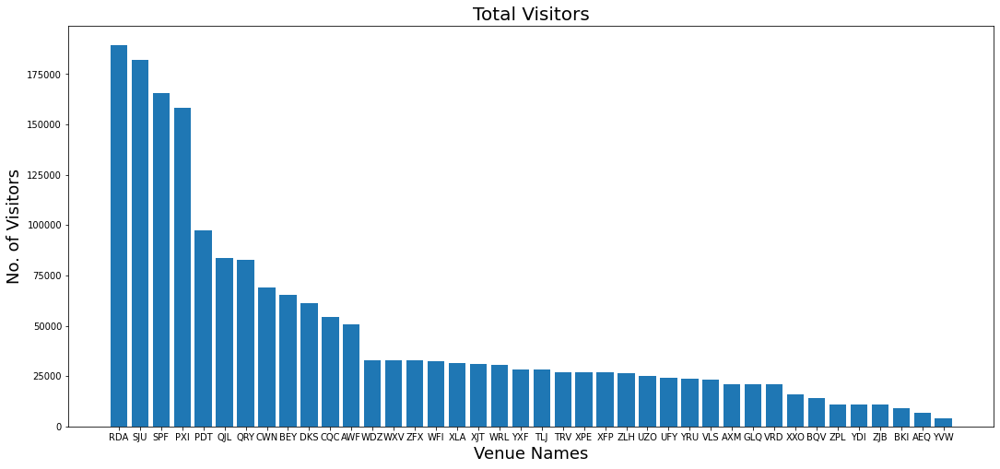

In [20]:
# Create another data frame using daily visitors sum data
venue_daily_visitors_sum = venue_daily_visitors.reindex(venue_daily_visitors.sum().sort_values(ascending=False).index, axis=1)
print(venue_daily_visitors_sum.head())
# Plot bar chart for total visitors
plt.figure(figsize=(18, 8))
x_pos = np.arange(len(venue_daily_visitors_sum.columns))
plt.bar(x_pos, venue_daily_visitors_sum.sum(), align='center')
plt.xticks(x_pos, venue_daily_visitors_sum.columns)
plt.xlabel('Venue Names', fontsize=18)
plt.ylabel('No. of Visitors', fontsize=18)
plt.title('Total Visitors', fontsize=20)
plt.show()

### **Stacked Area Plot**

Let's use stacked area plot to analyse the time series daily visit data.

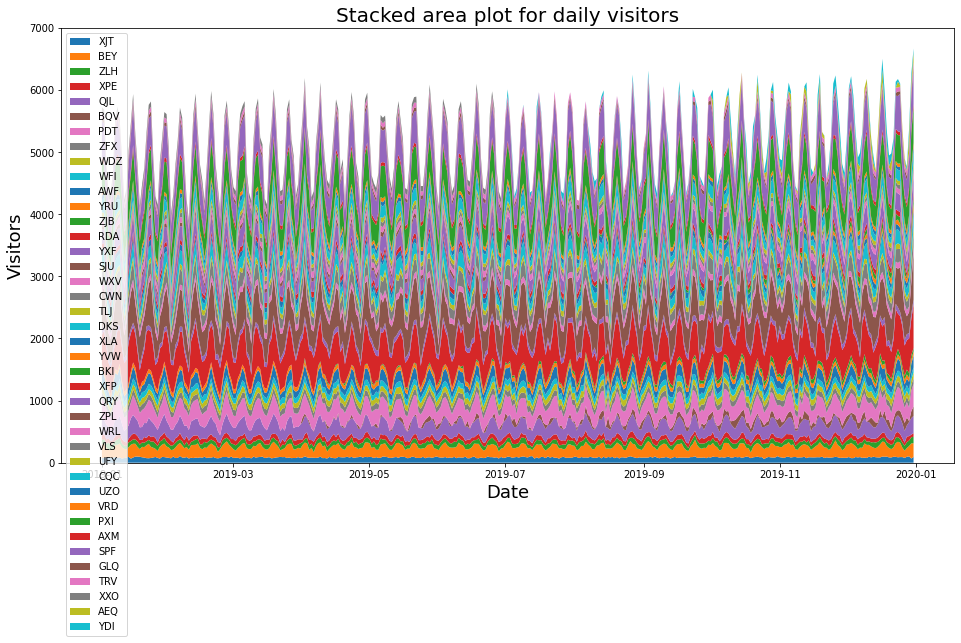

In [21]:
# Stacked Area Plot
plt.figure(figsize=(16, 8))
plt.stackplot(venue_daily_visitors.index, venue_daily_visitors.transpose())
plt.xlabel('Date', fontsize=18)
plt.ylabel('Visitors', fontsize=18)
plt.title('Stacked area plot for daily visitors', fontsize=20)
plt.legend(venue_daily_visitors.columns, loc=2)
plt.show()


### **Segmentation**

Here we will segment the data based on the total no of visitors


*   High      :  **Visitsors** >125000
*   Medium    : 125000> **Visitsors** >50000
*   Low       : 50000> **Visitsors** > 20000
*   Very Low  : **Visitsors** < 20000

In [22]:
# Copy the data into another data frame
data=venue_daily_visitors

# High no of visitors
selected = data.columns[data.sum() > 125000]
data_selected1 = data[selected]
data = data.drop(selected, axis=1)


# Medium no of visitors
selected = data.columns[data.sum() > 50000]
data_selected2 = data[selected]
data = data.drop(selected, axis=1)



# Low no of visitors
selected = data.columns[data.sum() > 20000]
data_selected3 = data[selected]
data = data.drop(selected, axis=1)

# Print all data
print('\n High Visitors Venue')
print(data_selected1.head())
print('\n Medium Visitors Venue')
print(data_selected2.head())
print('\n Low Visitors Venue')
print(data_selected3.head())
print('\n Very Low Visitors Venue')
print(data.head())


 High Visitors Venue
            RDA  SJU  PXI  SPF
Date                          
2019-01-01  479  609  523  588
2019-01-02  657  610  399  605
2019-01-03  548  444  384  436
2019-01-04  401  400  343  366
2019-01-05  420  398  374  453

 Medium Visitors Venue
            BEY  QJL  PDT  AWF  CWN  DKS  QRY  CQC
Date                                              
2019-01-01  222  280  327  178  228  240  244  187
2019-01-02  222  224  284  159  204  187  210  248
2019-01-03  166  240  255  131  143  120  222  141
2019-01-04  115  183  201  108  114  143  202   32
2019-01-05  131  181  179   74  131  173  163   98

 Low Visitors Venue
            XJT  ZLH  XPE  ZFX  WDZ  WFI  YRU  YXF  WXV  TLJ  XLA  XFP  WRL  \
Date                                                                          
2019-01-01   75   69   74   87  106   98   64   74   90   68   76   73   93   
2019-01-02   82   79   81   98   89   88   64   90   80  104   63   73   73   
2019-01-03   80   56   71   88   75   84   

### **Value Based Categorization**

High: ['RDA', 'SJU', 'PXI', 'SPF']
Medium: ['BEY', 'QJL', 'PDT', 'AWF', 'CWN', 'DKS', 'QRY', 'CQC']
Low: ['XJT', 'ZLH', 'XPE', 'ZFX', 'WDZ', 'WFI', 'YRU', 'YXF', 'WXV', 'TLJ', 'XLA', 'XFP', 'WRL', 'VLS', 'UFY', 'UZO', 'VRD', 'AXM', 'GLQ', 'TRV']
Very Low: ['BQV', 'ZJB', 'YVW', 'BKI', 'ZPL', 'XXO', 'AEQ', 'YDI']


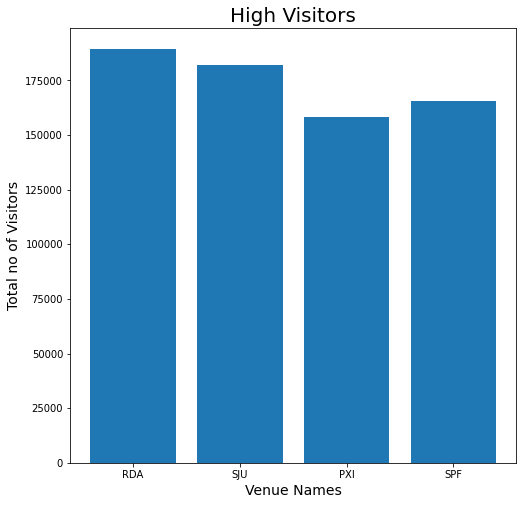

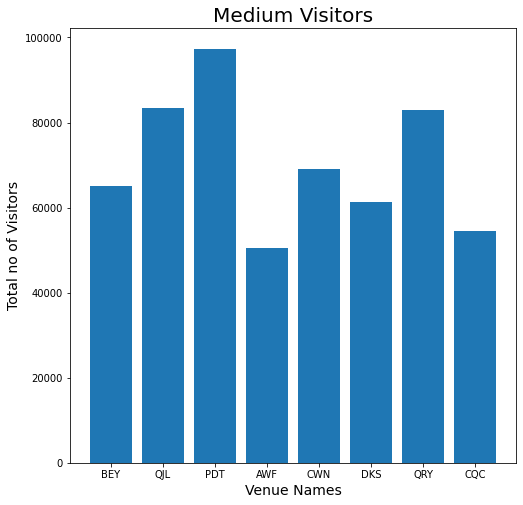

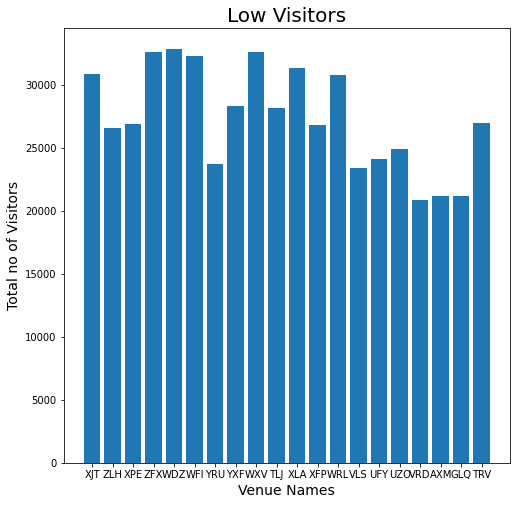

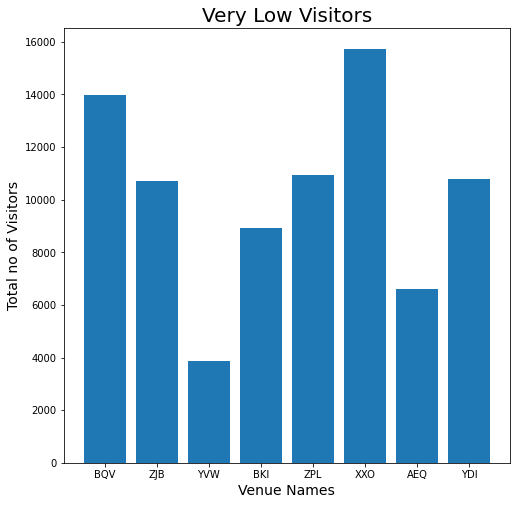

In [23]:
categories = ['High', 'Medium', 'Low', 'Very Low']
categories_selected = [[] for i in range(len(categories))]
for name in venue_daily_visitors.columns:
    total_visitors = venue_daily_visitors[name].sum()
    if total_visitors > 125000:
        category = 0
    elif total_visitors > 50000:
        category = 1
    elif total_visitors > 20000:
        category = 2
    else:
        category = 3
    categories_selected[category].append(name)

for i in range(len(categories)):
    print(categories[i] + ': ' + str(categories_selected[i]))

for i, selected in enumerate(categories_selected):
    plt.figure(figsize=(8, 8))
    x_pos = np.arange(len(venue_daily_visitors[selected].columns))
    plt.bar(x_pos, venue_daily_visitors[selected].sum(), align='center')
    plt.xticks(x_pos, venue_daily_visitors[selected].columns)
    plt.xlabel('Venue Names', fontsize=14)
    plt.ylabel('Total no of Visitors', fontsize=14)
    plt.title(categories[i] + ' Visitors', fontsize=20)


## **Correlation using Heat Maps**


The visualisation below explains how the venue data re related with each other. This is defined by the correlation coffieient between them which ranges from -1 to 1. If the value is near 1 for any two venues, we can say that they are positively correlated with each other. If the value is near -1 negatively correlated.


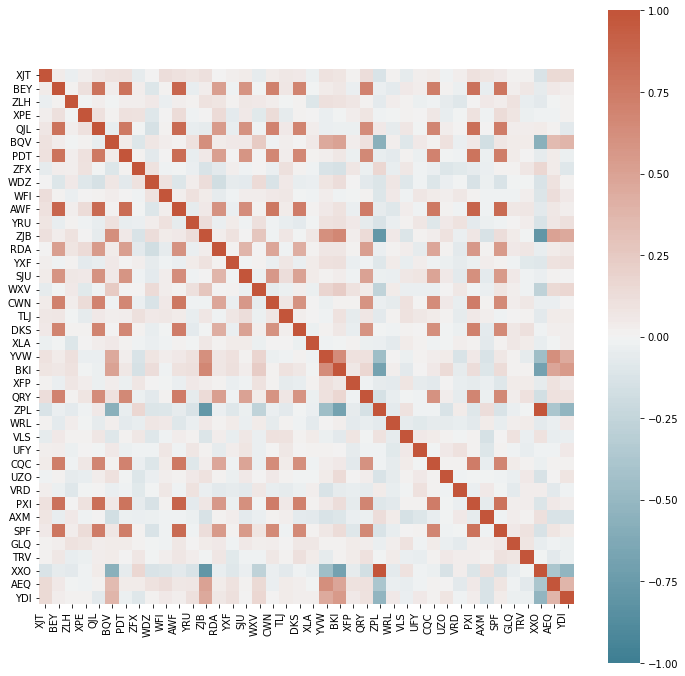

In [24]:
# Heat Map for all venues to show how each of the venues are correlated with each other

plt.figure(figsize=(12, 12))
corr = venue_daily_visitors.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, horizontalalignment='right')
plt.show()

**Heat Map (High no. of Visitors)**

Let's find correlation using weighted heat map for the venues with high no of total visitors. In this case, we will be using weighted heat map which will also show the correlation cofficient value between the venues in the map.

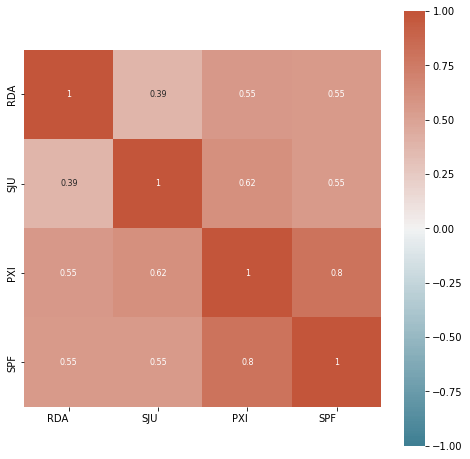

In [25]:
# Heat map for high total visitors venues

selected = venue_daily_visitors.columns[venue_daily_visitors.sum() > 125000]
plt.figure(figsize=(8, 8))
corr = venue_daily_visitors[selected].corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right')
plt.show()


Looking into the heat map, it is clear that venues 'SPF' and 'PXI' are highly correlated with each other. There might be multiple reasons behind this and creating a line plot between these would give us more details.

**Heat Map (Medium no. of visitors venue)**

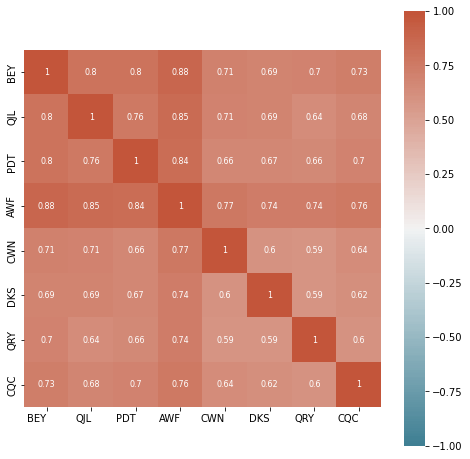

In [26]:
# Heat map for medium total visitors venues

selected = venue_daily_visitors.columns[venue_daily_visitors.sum().between(50000, 150000)]
plt.figure(figsize=(8, 8))
corr = venue_daily_visitors[selected].corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right')
plt.show()

**Heat Map (Low no. of visitors venue)**

Anlyzing this heat map, we can see that the venues AWF and BEY are highly correlated with each other with the correlation value 0.88.

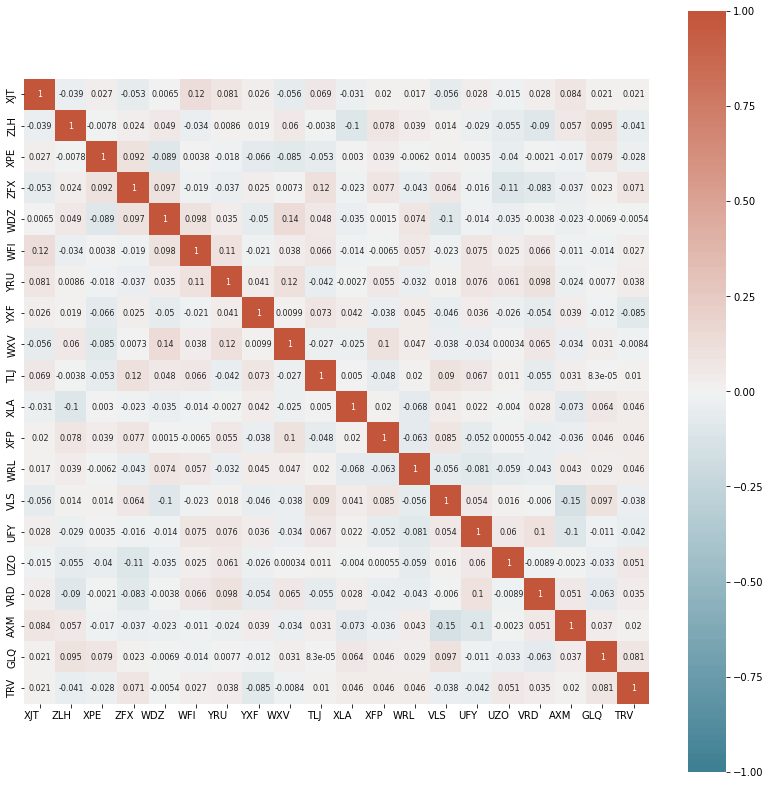

In [27]:
# Heat map for low total visitors venues

selected = venue_daily_visitors.columns[venue_daily_visitors.sum().between(20000,50000)]
plt.figure(figsize=(14, 14))
corr = venue_daily_visitors[selected].corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right')
plt.show()

**Heat Map (Very Low Total Visitors)**


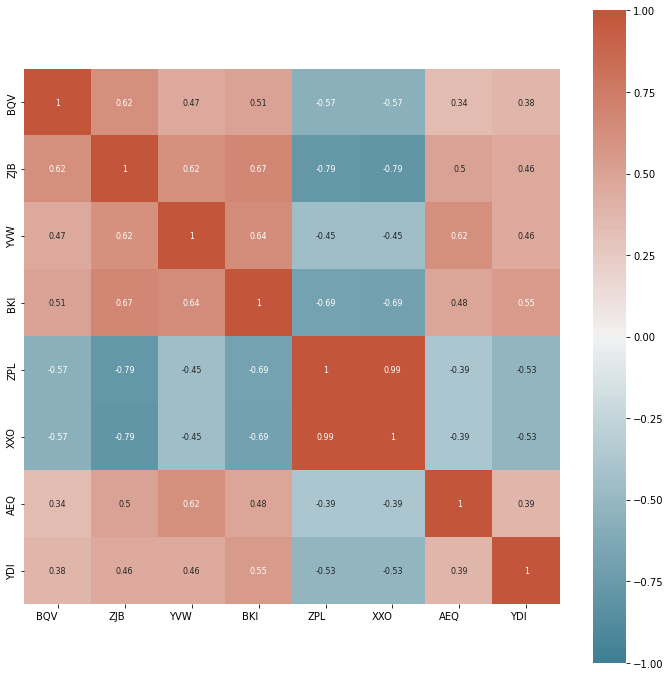

In [28]:
# Heat map for very low total visitors venues

selected = venue_daily_visitors.columns[venue_daily_visitors.sum()<20000]
plt.figure(figsize=(12, 12))
corr = venue_daily_visitors[selected].corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right')
plt.show()

### **Rolling Average Line Plot to further analyse correlation**

Rolling average plot calculates the average value for the provided time period for each day of the time series. For the firs data point, it will calculate the average of first 28 day and after that, the average calculation window is shifted for one day and same process is repeated.

On the heat map above, we have seen a strong positive correlation between the venues SPF and PXI. Now lets further analyse the data for these venues using weighted heat map to find out the trend.



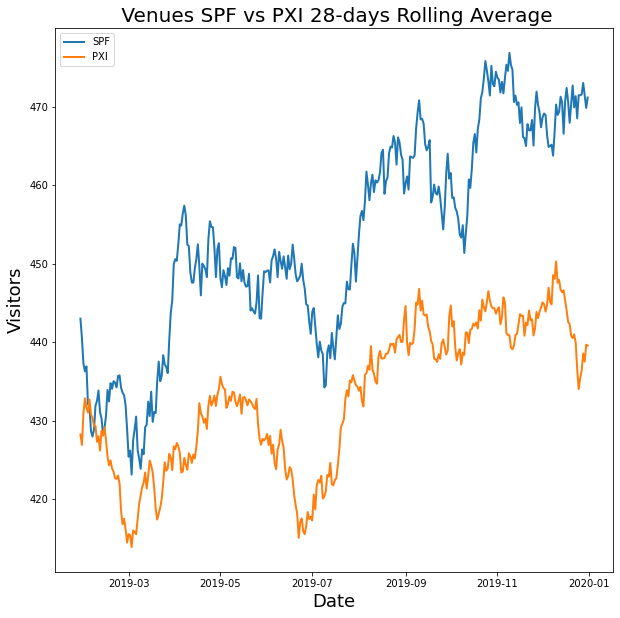

In [29]:
period = 28
rolling_average = venue_daily_visitors.rolling(window=period).mean()

selected = ['SPF', 'PXI']
plt.figure(figsize=(10, 10))
#plt.plot(venue_daily_visitors[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Visitors', fontsize=18)
plt.title(' Venues SPF vs PXI 28-days Rolling Average', fontsize=20)
plt.legend(selected, loc=2)
plt.show()

Analyzing the line plot for 28 day average of the products SPF and PXI, it is clear that they both follow similar pattern with similar peak and troughs. This means that the number of visitors for these two venues over the year follow similar pattern.

### **Scatter Plot to analyse the correlation**
Let's visualize the highly correlated venues AWF and BEY using scatter plot. Scatter plot is also used to find the correlation between two variables.

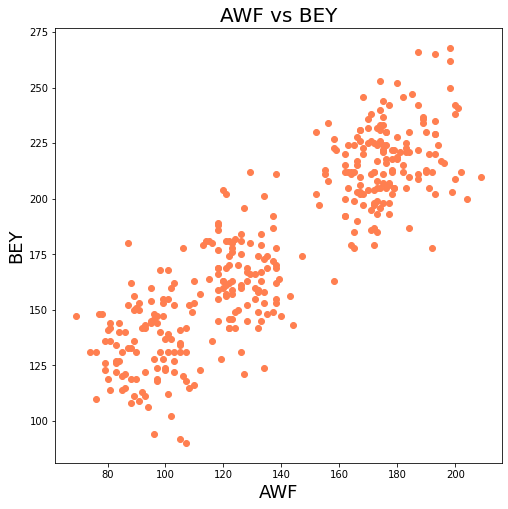

In [30]:
# Let's analyze them (AWF & BEY) using scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(venue_daily_visitors['AWF'], venue_daily_visitors['BEY'], c='coral')
plt.title('AWF vs BEY', fontsize=20)
plt.xlabel('AWF', fontsize=18)
plt.ylabel('BEY', fontsize=18)
plt.show()

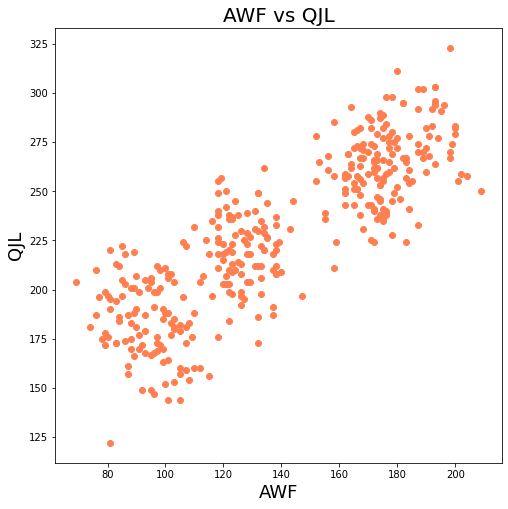

In [31]:
# Let's analyze them (AWF & QJL) using scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(venue_daily_visitors['AWF'], venue_daily_visitors['QJL'], c='coral')
plt.title('AWF vs QJL', fontsize=20)
plt.xlabel('AWF', fontsize=18)
plt.ylabel('QJL', fontsize=18)
plt.show()

It is clear from the scatter plot that they follow the positive correlation. AWF and BEY seems to have a stronger correlation than AWF and QJL as the scatter plot value are more towards the 45 degree angle for them.

For the low visitors venues, we couldn't see any significant correlation (positive or negative) between them.

Looking into the heat map, XXO and ZPL have high correlation between them with the value 0.99 while XXO and ZJB have lowest with value -0.79. Let's analyze these three and find the insights.

### **Heat Map (Interactive Visualisation)**


Interactive Heat Map for HIGH, MEDIUM and VERY LOW venues ( >5000 and <20000). Here are some functionality the interactive visualisation provides.

1. Hover over the box to find out the actual correlation value.
2. Zoom in and crop the value using magnifying lens icon
3. Save the zoomed in visualisation
4. Reset the plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
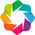

:HeatMap   [columns,index]   (value)

In [32]:
selected = venue_daily_visitors.columns[(venue_daily_visitors.sum()>50000) | (venue_daily_visitors.sum()<20000)]
venue_daily_visitors_selected=venue_daily_visitors[selected]

plot = venue_daily_visitors_selected.corr().hvplot.heatmap(
    frame_height=500, frame_width=500,
    title='Correlations betweeen venues',
    rot=90, cmap='blues'
).opts(invert_yaxis=True, clim=(-1, 1))
hv.extension('bokeh')
plot

###**Rolling Average**

Futher analyse the highly correlated venues with rolling average.
Rolling average helps us to see how the average value of data for a window (period) is distributed over the time. It will remove the insigficant dat from the time series data and helps us in analysing the trend. In this case, we are using period=28 (days) which means the moving average will be taken for 28 days range.




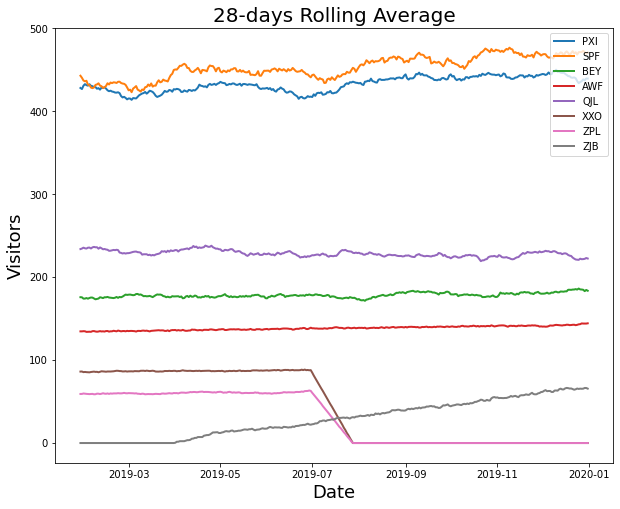

In [33]:
period = 28
rolling_average = venue_daily_visitors.rolling(window=period).mean()

selected = ['PXI', 'SPF','BEY','AWF','QJL','XXO', 'ZPL', 'ZJB']
plt.figure(figsize=(10, 8))
#plt.plot(venue_daily_visitors[selected], linewidth=0.5)
plt.gca().set_prop_cycle(None)
plt.plot(rolling_average[selected], linewidth=2)
# plt.ylim(ymin=0)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Visitors', fontsize=18)
plt.title('28-days Rolling Average', fontsize=20)
plt.legend(selected, loc=0)
plt.show()

### **Rolling Average(Interactive Visualization)**

In this case, we are creating rolling average (28 days) line plot usign hvplot. The interactive plot allows us to further analyse the data and play with it. Here are some of the things we can do.

1. Drag and reposition the graph inside the visualisation using the first button on the right.
2. Zoom in or Crop in the plot using the magnifier icon 
3. Wheel zoom button to zoom in using your mouse or touchpad
4. Hover over the data and see values for each point using hover icon
5. Download the zoomed or cropped part of visualisation as a png file
6. Reset the visualisation to it's original state (when created)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
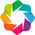

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [34]:
rolling_average = venue_daily_visitors.rolling(window=period).mean()

selected =  ['PXI', 'SPF','BEY','AWF','QJL','XXO', 'ZPL', 'ZJB']

plot = rolling_average[selected].hvplot.line(
    frame_height=500, frame_width=500,
    xlabel='Date', ylabel='Visitors',
    title='28-days Rolling Average'
)
hv.extension('bokeh')
plot

Analyzing the data, even if the venue XXO had the higher no. of visit for the first seven months, they both followed the same pattern. Also, for both of the venues, no. of visitors are zero after the August. This may be caused by different reasons such as the store closure.

### **Newly opened and closed venues**

By analysing the venues that has no visitors for any of the particular day, we can see if the venues were recently opened or closed.




In [35]:
# Let's find out the venues that has no visitors for any particular day and visualize the data
df = venue_daily_visitors.loc[:, (venue_daily_visitors == 0).any()]
df.head()

,BQV,ZJB,YVW,BKI,ZPL,XXO,AEQ,YDI
Date,,,,,,,,
2019-01-01,0,0,0,0,48,84,0,0
2019-01-02,0,0,0,0,55,98,0,0
2019-01-03,0,0,0,0,63,89,0,0
2019-01-04,0,0,0,0,63,90,0,0
2019-01-05,0,0,0,0,63,89,0,0


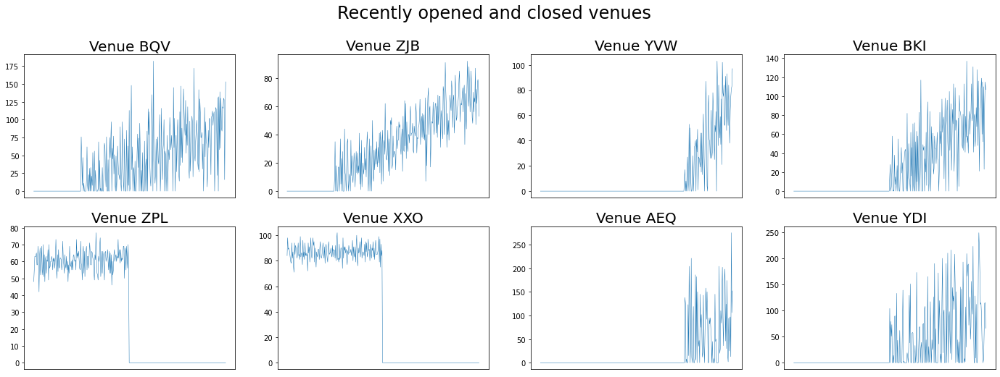

In [36]:
selected = ['BQV', 'ZJB', 'YVW', 'BKI', 'ZPL', 'XXO', 'AEQ', 'YDI']
no_visitors=venue_daily_visitors[selected]
counter = 1
fig = plt.figure(figsize=(24, 8))
fig.suptitle('Recently opened and closed venues', fontsize=24, position=(0.5, 1.0))
for name in no_visitors.columns:
    sub = fig.add_subplot(2, 4, counter)
    sub.set_title('Venue ' + name, fontsize=20)
    sub.plot(no_visitors.index, no_visitors[name], linewidth=0.5)
    sub.axes.get_xaxis().set_ticks([])  # remove the x ticks
    counter += 1
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.show()

### **Box Plot**
Box plot us used to find the outliers in a distributed data.
Box plot for high visitors venue.

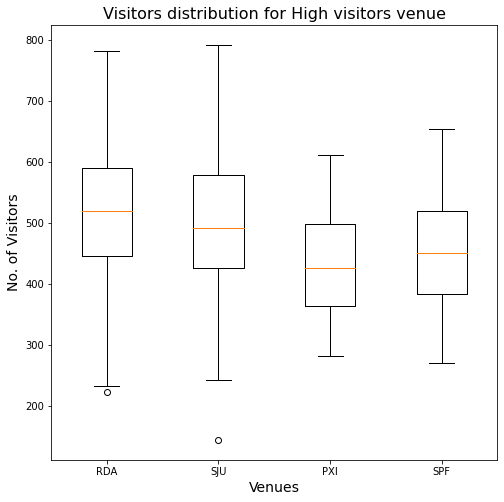

In [37]:
# Box Plot for high no of visitors

selected = ['RDA', 'SJU', 'PXI', 'SPF']

plt.figure(figsize=(8, 8))
# venue_daily_visitors[selected].boxplot()
plt.boxplot(venue_daily_visitors[selected].transpose(), labels=selected)
plt.xlabel('Venues', fontsize=14)
plt.ylabel('No. of Visitors', fontsize=14)
plt.title('Visitors distribution for High visitors venue', fontsize=16)
plt.show()


**Interactive box plot for high visitors venue using bokeh**

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
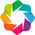

:BoxWhisker   [Variable]   (value)

In [38]:
selected = ['RDA', 'SJU', 'PXI', 'SPF']

plot = venue_daily_visitors[selected].hvplot.box(y=selected, legend=False,
tools=['hover', 'save', 'reset'],
xlabel='Venue Names',ylabel='Visits',title='Box Plot for high visitors venue',
frame_height=550, frame_width=550, box_alpha=0.5,color='red',
fontsize={'title': 16, 'labels': 15, 'xticks': 14, 'yticks': 14})

hv.extension('bokeh')

plot

**Box Plot for medium visitors venue**




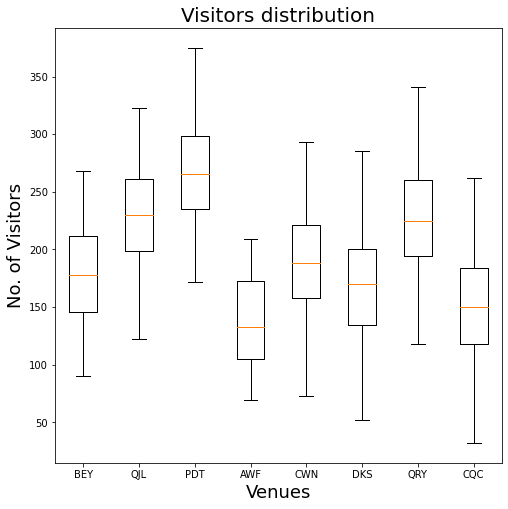

In [39]:
# Box Plot for medium no of visitors

selected = ['BEY', 'QJL', 'PDT', 'AWF', 'CWN', 'DKS', 'QRY', 'CQC']

plt.figure(figsize=(8, 8))
# venue_daily_visitors[selected].boxplot()
plt.boxplot(venue_daily_visitors[selected].transpose(), labels=selected)
plt.xlabel('Venues', fontsize=18)
plt.ylabel('No. of Visitors', fontsize=18)
plt.title('Visitors distribution', fontsize=20)
plt.show()

**Box Plot for Low Visitors Venue**

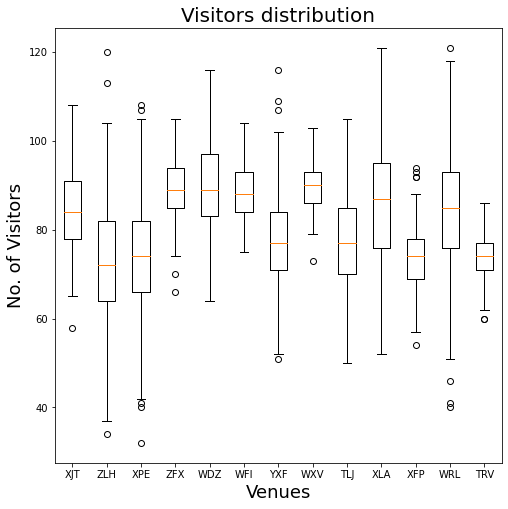

In [40]:
# Box Plot for low no of visitors

selected =['XJT', 'ZLH', 'XPE', 'ZFX', 'WDZ', 'WFI', 'YXF', 'WXV', 'TLJ', 'XLA', 'XFP', 'WRL', 'TRV']

plt.figure(figsize=(8, 8))
# venue_daily_visitors[selected].boxplot()
plt.boxplot(venue_daily_visitors[selected].transpose(), labels=selected)
plt.xlabel('Venues', fontsize=18)
plt.ylabel('No. of Visitors', fontsize=18)
plt.title('Visitors distribution', fontsize=20)
plt.show()

### **Line Plot**

This chart helps us in understanding the time series data of daily visits in each of the venues.

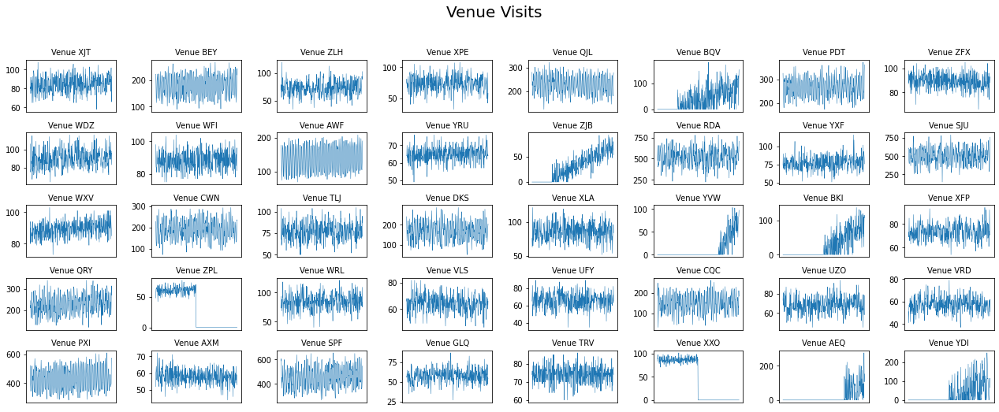

In [41]:

counter = 1
fig = plt.figure(figsize=(22, 8))
fig.suptitle('Venue Visits', fontsize=20, position=(0.5, 1.0))
for name in venue_daily_visitors.columns:
    sub = fig.add_subplot(5, 8, counter)
    sub.set_title('Venue ' + name, fontsize=10)
    sub.plot(venue_daily_visitors.index, venue_daily_visitors[name], linewidth=0.5)
    sub.axes.get_xaxis().set_ticks([])  
    counter += 1
plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

It looks like the venues ZPL and XXO are closed on the second half of the year while the venues BQV, ZJB, YVW, AEQ, BKI and YDI were opened this year.

### **Autocorrelation Plot**

Autocorrelation plot us used to find the seasonality of the time series data. It helps us to detect seasonal fluctuation in the data and predict the pereodic behaviours.

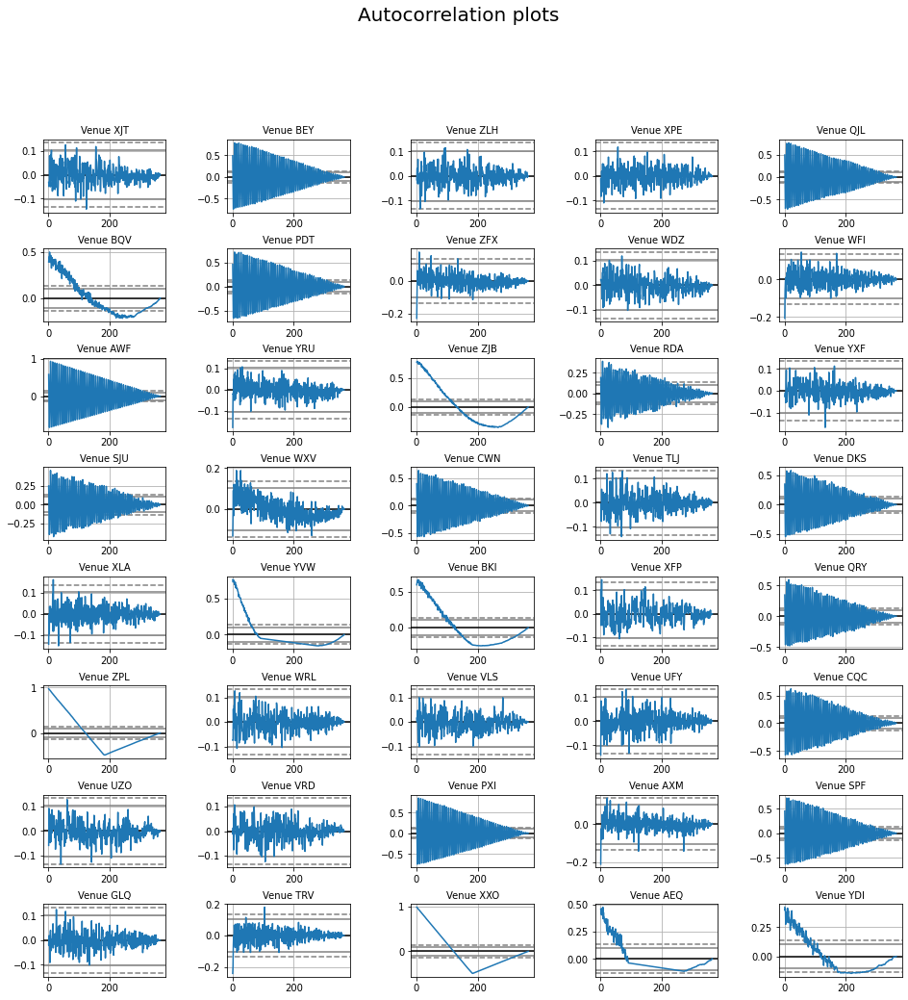

In [42]:
row = 0
col = 0
fig, axes = plt.subplots(figsize=(16, 16), nrows=8, ncols=5)
fig.suptitle('Autocorrelation plots', fontsize=20, position=(0.5, 1.0))
for name in venue_daily_visitors.columns:
    sub = pd.plotting.autocorrelation_plot(venue_daily_visitors[name], axes[row, col])
    sub.set_title('Venue ' + name, fontsize=10)
    sub.xaxis.label.set_visible(False)
    sub.yaxis.label.set_visible(False)
    col += 1
    if col == 5:
        row += 1
        col = 0
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()



**Lets analyse the detailed autocorrelation for the venues with high and medium visitors**


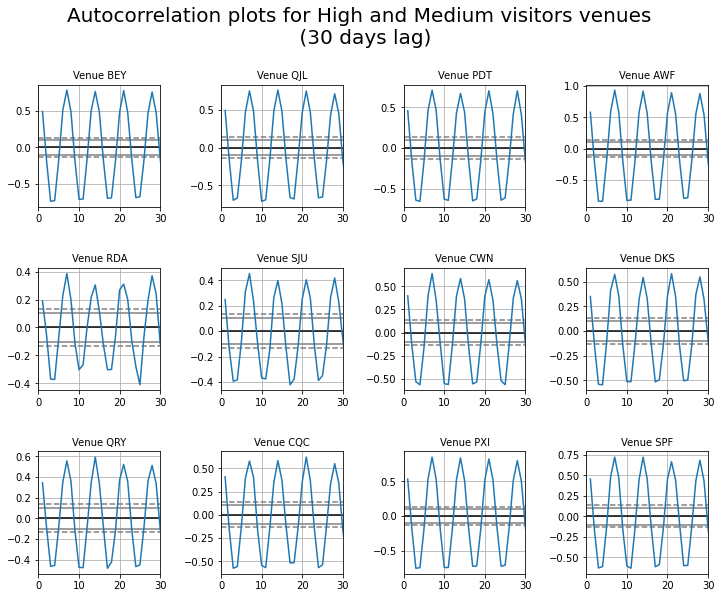

In [43]:
selected = venue_daily_visitors.columns[(venue_daily_visitors.sum()>50000)]
venue_daily_visitors_selected=venue_daily_visitors[selected]


row = 0
col = 0
fig, axes = plt.subplots(figsize=(12, 9), nrows=3, ncols=4)
fig.suptitle('Autocorrelation plots for High and Medium visitors venues \n (30 days lag)', fontsize=20, position=(0.5, 1.0))
for name in venue_daily_visitors_selected.columns:
    sub = pd.plotting.autocorrelation_plot(venue_daily_visitors_selected[name], axes[row, col])
    sub.set_title('Venue ' + name, fontsize=10)
    sub.xaxis.label.set_visible(False)
    sub.yaxis.label.set_visible(False)
    sub.set_xlim([0, 30])
    col += 1
    if col == 4:
        row += 1
        col = 0
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()


**Let's create autocorrelation plot for the very low visitors venye time frame or 30 days.**


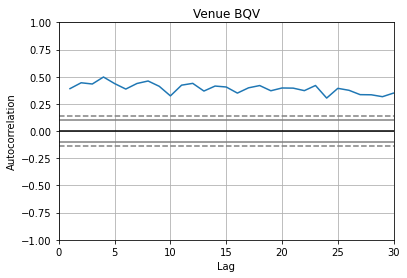

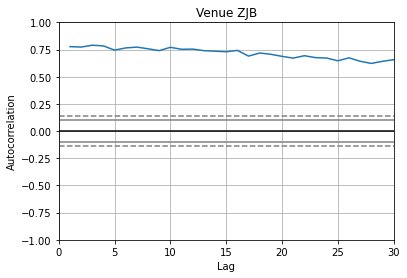

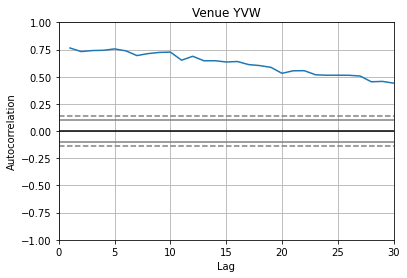

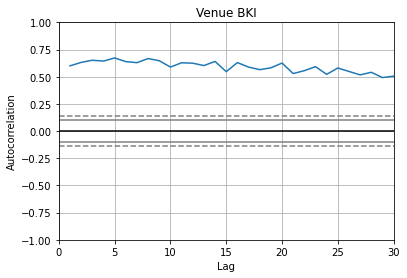

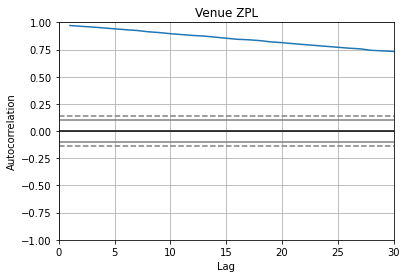

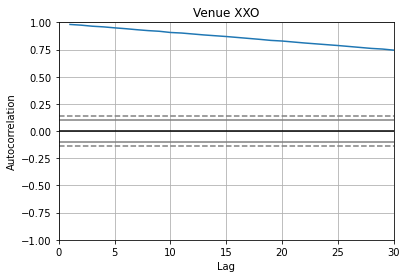

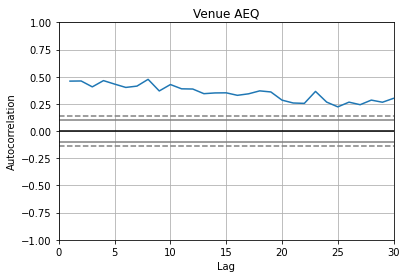

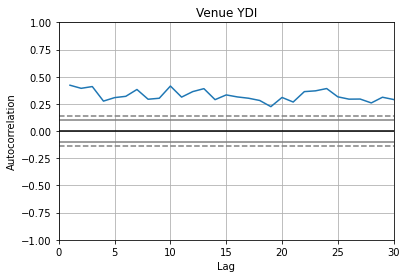

In [44]:
# Autocorrelation

selected =['BQV', 'ZJB', 'YVW', 'BKI', 'ZPL', 'XXO', 'AEQ', 'YDI']

for name in selected:
    pd.plotting.autocorrelation_plot(venue_daily_visitors[name])
    plt.xlim([0, 30]) # uncomment this line to zoom in
    plt.title('Venue ' + name)
    plt.show()




### **Bar Chart**

In this case, we will analyze how the total number of visitors across all the stores varies over each of month of the year. We will see in which month/season the highest numbers of the visitors visit the stores. 

**Visitors By Month**

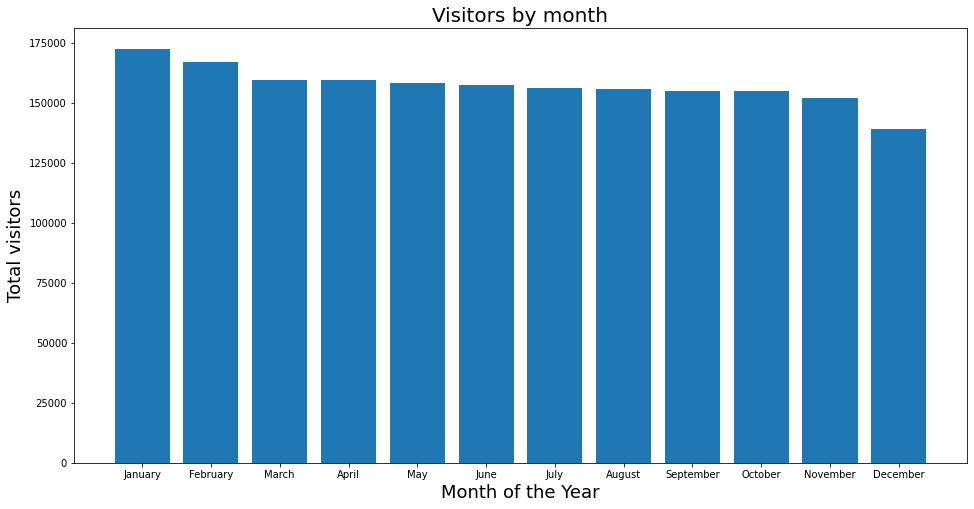

In [45]:
# Group the records based on the month (total number of visitors each month for each store)
monthly_visitors=venue_daily_visitors.groupby(by=[venue_daily_visitors.index.month_name()], sort=False)[['XJT', 'BEY', 'ZLH', 'XPE', 'QJL', 'BQV', 'PDT', 'ZFX', 'WDZ',
'WFI','AWF', 'YRU', 'ZJB', 'RDA', 'YXF', 'SJU', 'WXV', 'CWN', 'TLJ', 'DKS','XLA', 'YVW', 'BKI', 'XFP', 'QRY', 'ZPL', 'WRL', 'VLS', 'UFY', 'CQC','UZO', 'VRD', 'PXI',
 'AXM', 'SPF', 'GLQ', 'TRV', 'XXO', 'AEQ', 'YDI']].sum()

total_monthly_visitors=monthly_visitors.transpose()
plt.figure(figsize=(16, 8))
x_pos = np.arange(len(total_monthly_visitors.columns))
plt.bar(x_pos, total_monthly_visitors.sum().sort_values(ascending=False), align='center')
plt.xticks(x_pos, total_monthly_visitors.columns)
plt.xlabel('Month of the Year', fontsize=18)
plt.ylabel('Total visitors', fontsize=18)
plt.title('Visitors by month', fontsize=20)
plt.show()




**Visitors By Week**

Now, let's analyze the data based on the day of week to analyze which day the most number of visitors come to the venues.

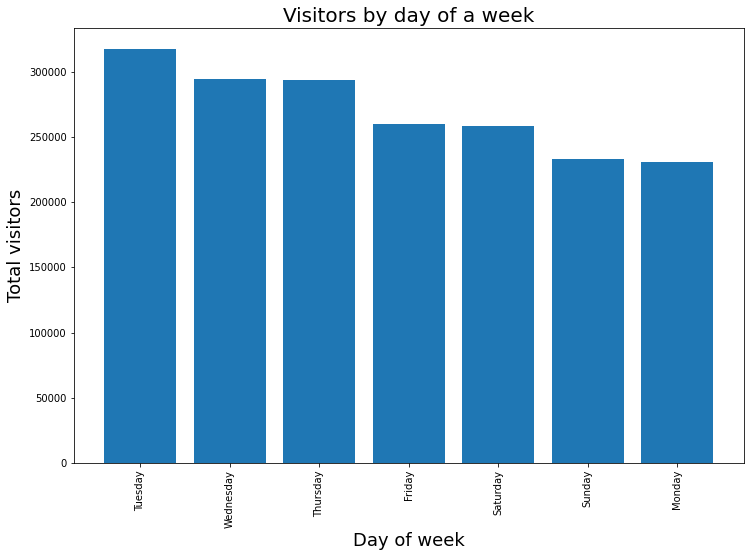

In [46]:
# # Group the records based on the day of the week (total number of visitors each day of the week for each store)

daily_visitors=venue_daily_visitors.groupby(by=[venue_daily_visitors.index.day_name()], sort=False)[['XJT', 'BEY', 'ZLH', 'XPE', 'QJL', 'BQV', 'PDT', 'ZFX', 'WDZ',
'WFI','AWF', 'YRU', 'ZJB', 'RDA', 'YXF', 'SJU', 'WXV', 'CWN', 'TLJ', 'DKS','XLA', 'YVW', 'BKI', 'XFP', 'QRY', 'ZPL', 'WRL', 'VLS', 'UFY', 'CQC','UZO', 'VRD', 'PXI',
'AXM', 'SPF', 'GLQ', 'TRV', 'XXO', 'AEQ', 'YDI']].sum()

total_daily_visitors=daily_visitors.transpose()
plt.figure(figsize=(12, 8))
x_pos = np.arange(len(total_daily_visitors.columns))
plt.bar(x_pos, total_daily_visitors.sum().sort_values(ascending=False), align='center')
plt.xticks(x_pos, total_daily_visitors.columns, rotation='vertical')
plt.xlabel('Day of week', fontsize=18)
plt.ylabel('Total visitors', fontsize=18)
plt.title('Visitors by day of a week', fontsize=20)
plt.show()




### **Rolling Average**

Rolling average of total no of visitors

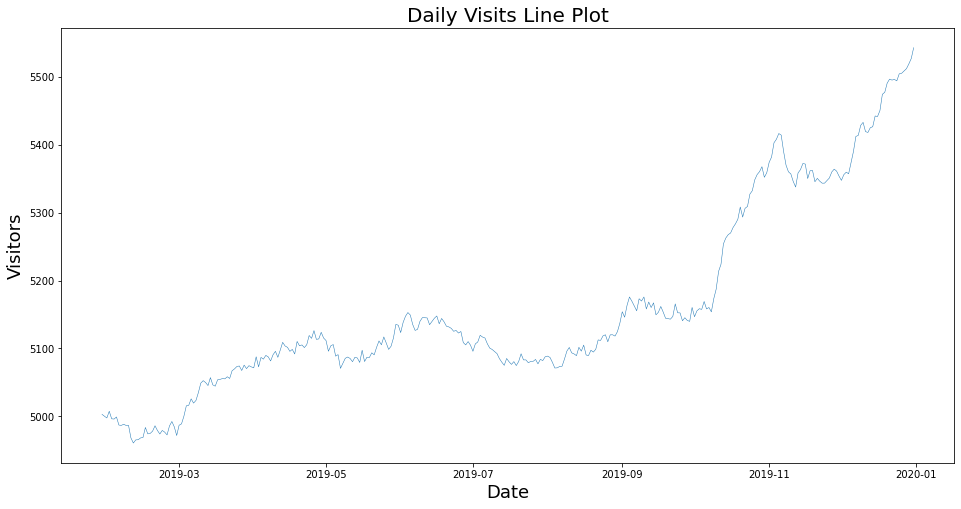

In [47]:
visitors_count_each_day=venue_daily_visitors.transpose()
visitors_count_each_day_sum=visitors_count_each_day.sum().rolling(28).mean()


plt.figure(figsize=(16, 8))
plt.plot(visitors_count_each_day_sum, linewidth=0.5)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Visitors', fontsize=18)
plt.title('Daily Visits Line Plot', fontsize=20)
# plt.legend(visitors_count_each_day_sum.columns, loc=2)
plt.show()

# Summary Data (Including all dataframes)


### **Bar Chart**

Let's summarize the summary data using bar chart.


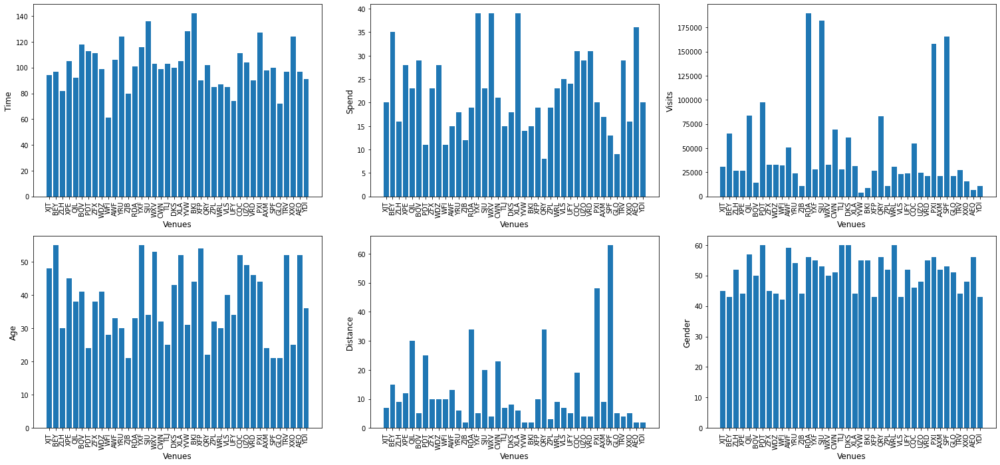

In [48]:
# Bar chart for Summary Data

plt.figure(figsize=(21, 14))
counter = 1
x_pos = np.arange(len(visitors_summary.index))
for attribute in visitors_summary:
    sub = plt.subplot(3, 3, counter)
    sub.bar(x_pos, visitors_summary[attribute], align='center')
    sub.set_xticks([])
    sub.set_xticks(x_pos)
    sub.set_xticklabels(visitors_summary.index, rotation=90, fontsize=10)
    sub.set_xlabel('Venues', fontsize=12)
    sub.set_ylabel(attribute, fontsize=12)
    counter += 1
plt.tight_layout()
plt.show()

### **Spider Plot**

Let's analyse how each of data is distributed for each of the venue using spider plot. I have included visits and spend in  the upper half of the plot. Any plot that is more concerntrated in uppper half of the circle would be someting we should look for

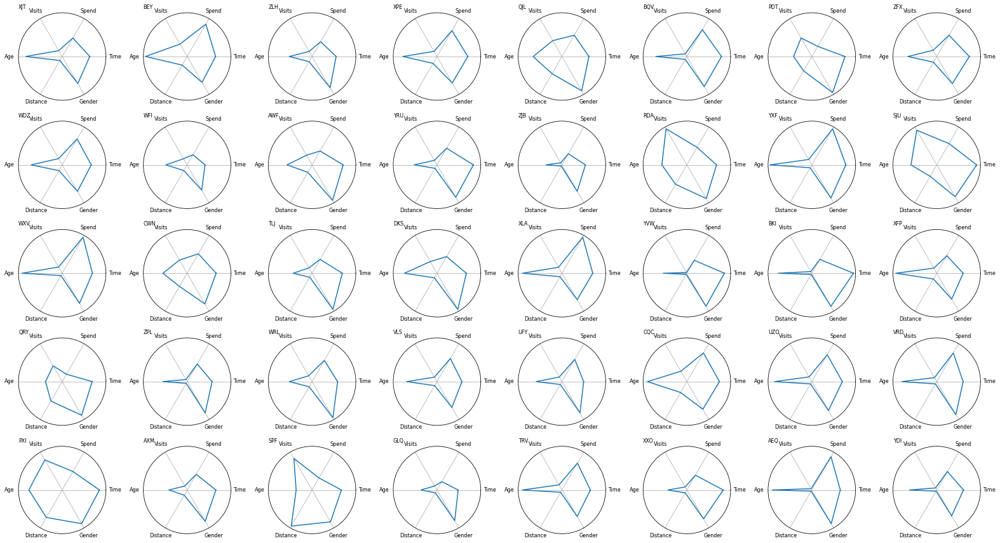

In [49]:
# Spider plot for all venues

normalised_data = visitors_summary / visitors_summary.max()
# print(normalised_data.head())

n_attributes = len(visitors_summary.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(22, 12))
counter = 1
for name in normalised_data.index:
    # values = normalised_data.transpose()[name].values.flatten().tolist()
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(5, 8, counter, polar=True)
    sub.plot(angles, values)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=8)
    sub.set_title(name, fontsize=8, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

Spider Plot comparing high visit venues

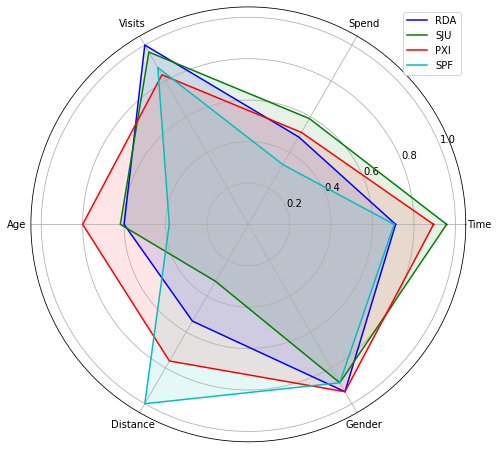

In [50]:
normalised_data = visitors_summary / visitors_summary.max()
# print(normalised_data.head())

selected = ['RDA', 'SJU', 'PXI', 'SPF']

n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
colours = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
c = 0
plt.figure(figsize=(8, 8))
sub = plt.subplot(1, 1, 1, polar=True)
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub.plot(angles, values, colours[c % len(colours)], label= name)
    sub.fill(angles, values, colours[c % len(colours)], alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns)
    c += 1
plt.legend(loc=1)
plt.show()


### **Correlation using Heat Maps**

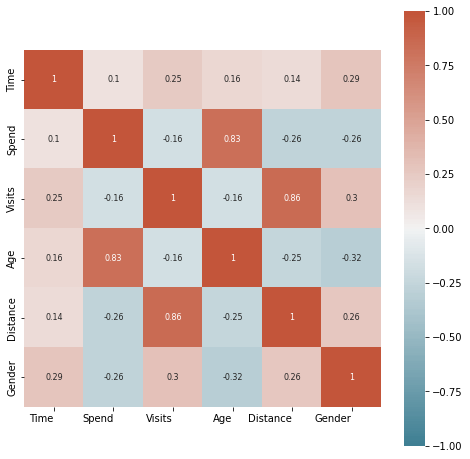

In [51]:
# Correlelation using heat map
plt.figure(figsize=(8, 8))
corr = visitors_summary.corr()
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap=sns.diverging_palette(220, 20, n=200), square=True, annot=True,
                 annot_kws={"size": 8})
ax.set_xticklabels(ax.get_xticklabels(), horizontalalignment='right')
plt.show()

### **Correllogram**

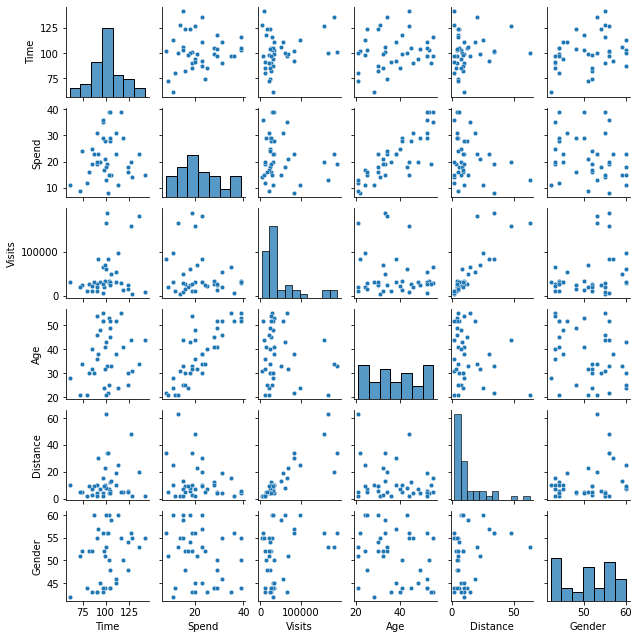

In [52]:
sns.pairplot(visitors_summary, height=1.5, plot_kws={'s': 20})
plt.show()

### **Radar Plot for high and medium visitors**


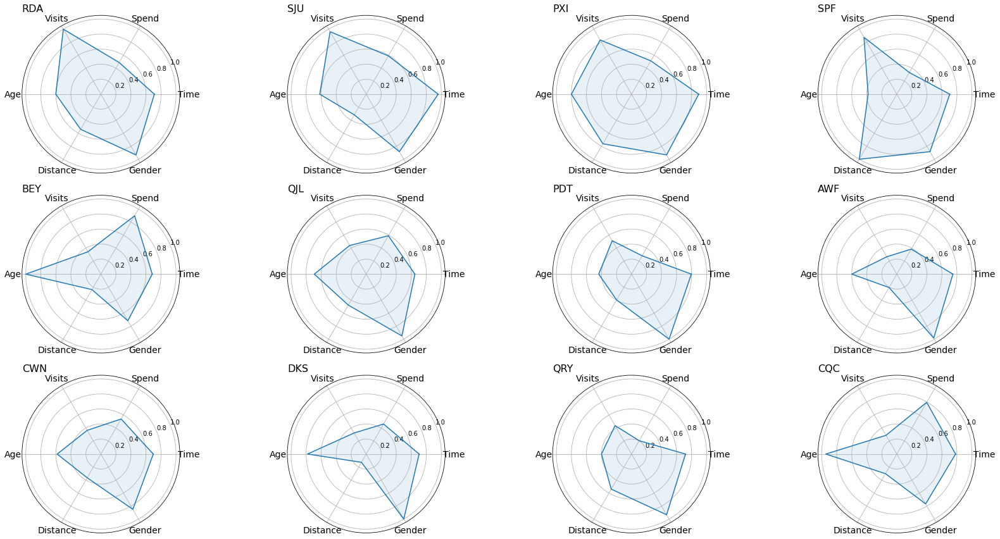

In [53]:
selected = ['RDA', 'SJU', 'PXI', 'SPF','BEY', 'QJL', 'PDT', 'AWF', 'CWN', 'DKS', 'QRY', 'CQC']

normalised_data = visitors_summary / visitors_summary.max()
# print(normalised_data.head())
n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(24, 12))
counter = 1
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(3, 4, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=14)
    sub.set_title( name, fontsize=16, loc='left')
    counter += 1
plt.tight_layout()
plt.show()


### **Radar / Spider Plot for top 5 spending venues**

Sort the data by spend and get top 5 venues where spending is high and draw a spider plot to visualise the data.

In [54]:
visitors_summary_s=visitors_summary.sort_values(by=['Spend'], ascending=False).head(5)
visitors_summary_s.head()

,Time,Spend,Visits,Age,Distance,Gender
XLA,105,39,31393,52,6,44
WXV,103,39,32661,53,4,50
YXF,116,39,28315,55,5,55
AEQ,97,36,6609,52,2,56
BEY,97,35,65178,55,15,43


Here, Cenues XLA, WXV, YXF, AEQ, and BEY are the 5 venues with highest spend values, lets analyze them using spider plot

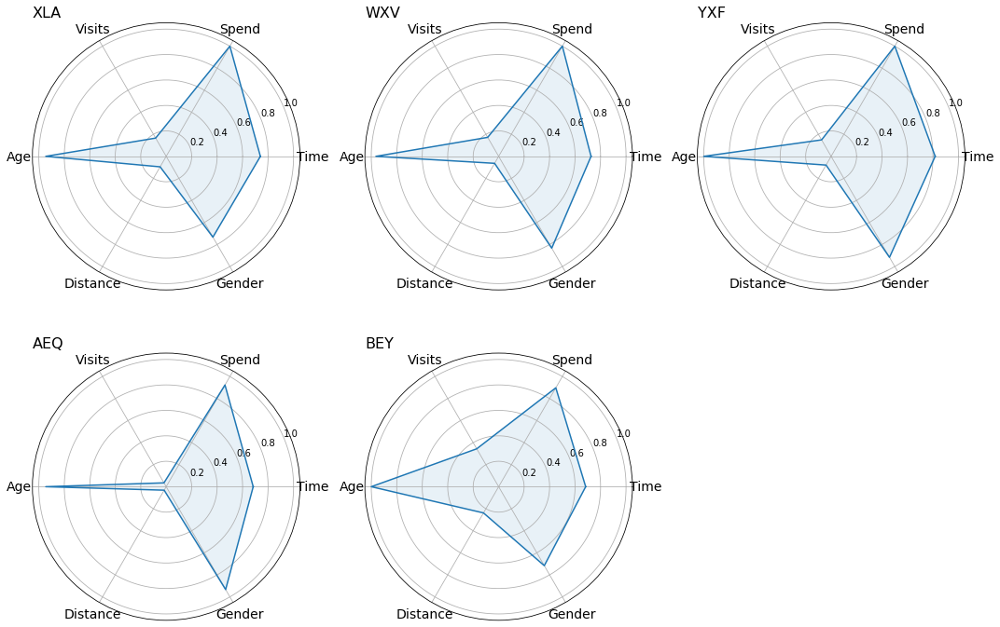

In [55]:
selected = ['XLA', 'WXV', 'YXF', 'AEQ','BEY']

normalised_data = visitors_summary / visitors_summary.max()
# print(normalised_data.head())
n_attributes = len(normalised_data.columns)
angles = [n / float(n_attributes) * 2 * np.pi for n in range(n_attributes + 1)]
plt.figure(figsize=(15, 10))
counter = 1
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    values += values[:1]
    sub = plt.subplot(2, 3, counter, polar=True)
    sub.plot(angles, values)
    sub.fill(angles, values, alpha=0.1)
    sub.set_ylim(ymax=1.05)
    sub.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    sub.set_xticks(angles[0:-1])
    sub.set_xticklabels(normalised_data.columns, fontsize=14)
    sub.set_title( name, fontsize=16, loc='left')
    counter += 1
plt.tight_layout()
plt.show()

### **Comparative Bar Chart**


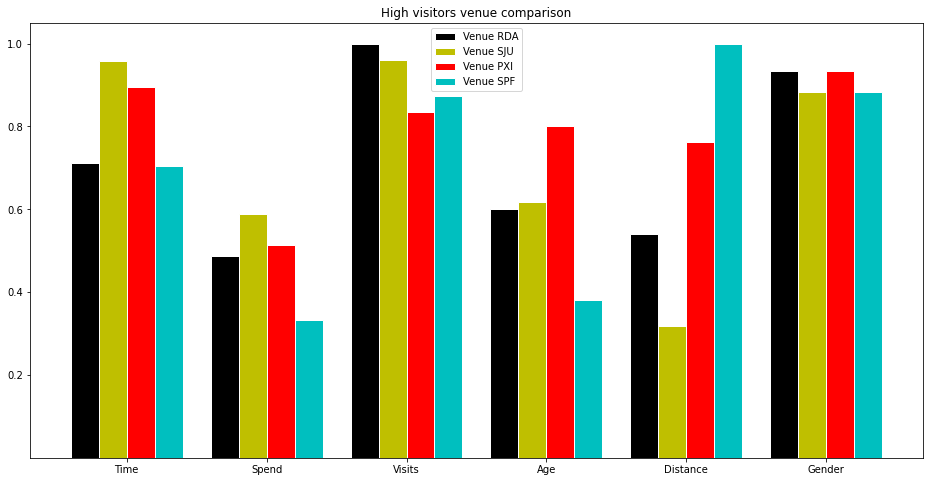

In [56]:
normalised_data = visitors_summary / visitors_summary.max()
# print(normalised_data.head())

selected = ['RDA', 'SJU', 'PXI', 'SPF']
colours = ['k', 'y', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(16, 8))
c = 0
n_bars = len(selected)
x_pos_base = np.arange(len(visitors_summary.columns))
bar_width = 0.8 / n_bars
for name in selected:
    values = normalised_data.loc[[name]].values.flatten().tolist()
    x_pos = [x + (bar_width * c) for x in x_pos_base]
    plt.bar(x_pos, values, color=colours[c % len(colours)],
            width=bar_width, edgecolor='white', label='Venue ' + name)
    c += 1
plt.yticks([0.2, 0.4, 0.6, 0.8, 1.0])
x_pos = [x + (bar_width * (c - 1) / 2) for x in x_pos_base]
plt.title("High visitors venue comparison")

plt.xticks(x_pos, visitors_summary.columns)
plt.legend()
plt.show()